## Importing packages

In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import random

## Question 1

#### Loading images and parameters

In [75]:
f, px, py, baseline = np.loadtxt("000020_allcalib.txt", usecols=1)
x1, y1, x2, y2 = np.loadtxt("000020.txt", usecols=range(1,5))
x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
left_img = cv2.imread("000020_left.jpg")
right_img = cv2.imread("000020_right.jpg")

In [4]:
f, px, py, baseline

(721.5377, 609.5593, 172.854, 0.5327119288)

In [5]:
x1, y1, x2, y2

(685, 181, 804, 258)

#### Check bounding box on left image

(-0.5, 1241.5, 374.5, -0.5)

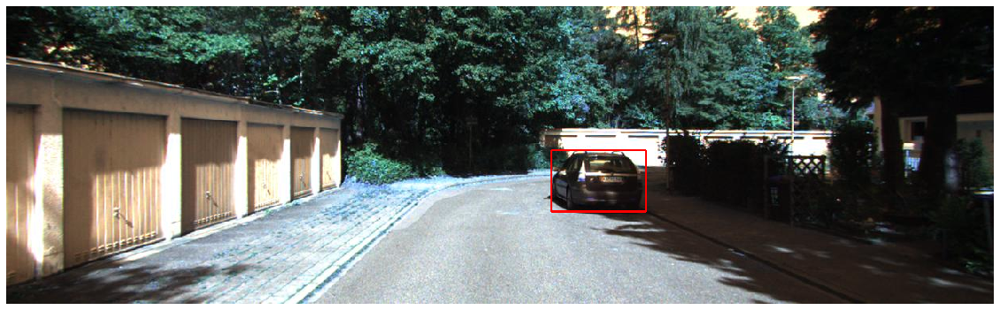

In [76]:
img = cv2.rectangle(left_img.copy(), (int(x1),int(y1)), (int(x2),int(y2)), (255, 0, 0), 2)
fig2, graph =plt.subplots(figsize=(20,10))
graph.imshow(img)
graph.axis('off')

#### Check same bounding box on right image

(-0.5, 1241.5, 374.5, -0.5)

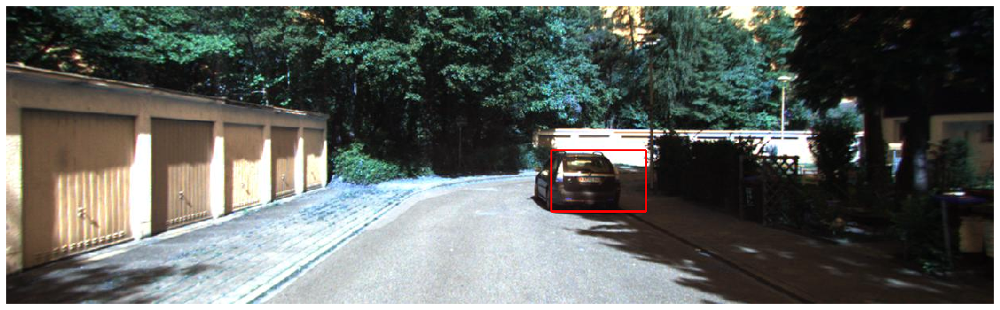

In [74]:
img = cv2.rectangle(right_img.copy(), (x1,y1), (x2,y2), (255, 0, 0), 2)
fig2, graph =plt.subplots(figsize=(20,10))
graph.imshow(img)
graph.axis('off')

#### Scanning on each scan line for every pixel within the bounding box

In [346]:
def SSD(left, right, point, length, patchsize=7):
    x, y = point
    upper, lower = int(np.ceil(patchsize/2)), int(np.floor(patchsize/2))
    result = []
    target = left[y-lower:y+upper,x-lower:x+upper]
    for i in range(length):
        patch = right[y-lower:y+upper,(x-i)-lower:(x-i)+upper]
        result.append(np.sum((target - patch)**2))
    xmin = np.argmin(result)
    return x-xmin

In [347]:
def depth(xmin,xmax,ymin,ymax,left,right,length,patchsize):
    Z = np.zeros((ymax-ymin+1, xmax-xmin+1))
    for i in range(xmin, xmax+1):
        for j in range(ymin, ymax+1):
            disparity = i-SSD(left,right,(i,j),length,patchsize)
            if disparity == 0:
                disparity = 1
            Z[j-ymin][i-xmin]= f*baseline/(disparity)
    return Z

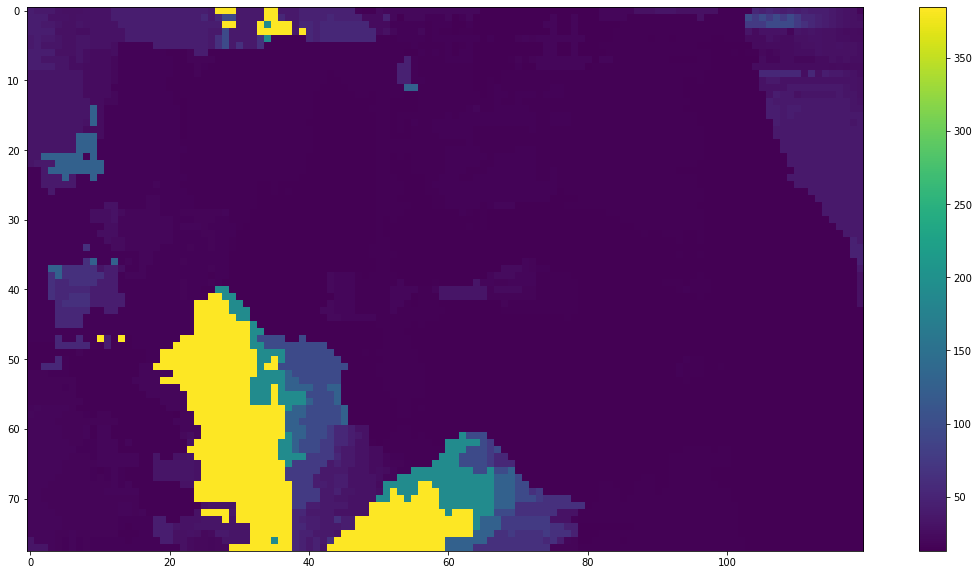

In [360]:
results = depth(x1, x2, y1, y2,left_img, right_img, 30, 17)
fig, graph =plt.subplots(figsize=(20,10))
im = graph.imshow(results)
fig.colorbar(im, ax=graph)

### Using HD3 to compute depth

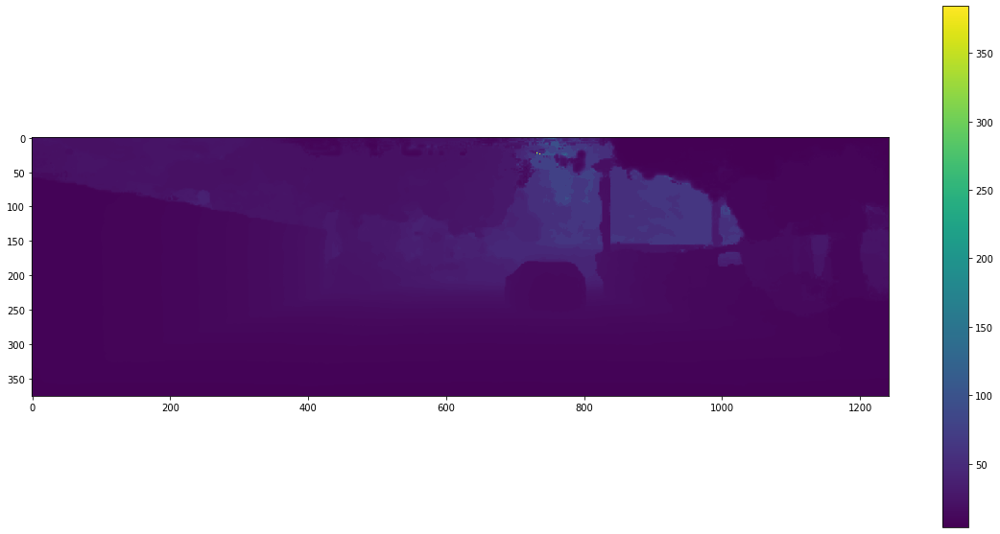

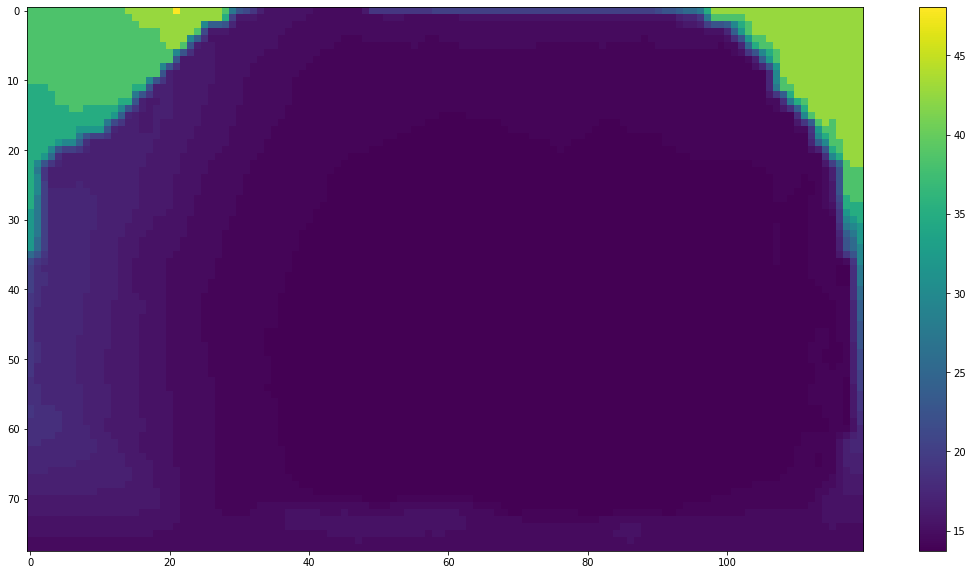

In [113]:
hd3 = cv2.imread("000020_left_hd3.png", cv2.IMREAD_GRAYSCALE)
hd3_depth = (f*baseline)/hd3
hd3_car_depth = hd3_depth[y1:y2+1,x1:x2+1]
fig, graph =plt.subplots(figsize=(20,10))
im = graph.imshow(hd3_depth)
fig.colorbar(im, ax=graph)
fig, graph =plt.subplots(figsize=(20,10))
im = graph.imshow(hd3_car_depth)
fig.colorbar(im, ax=graph)

### Construct 3D bounding box

#### convert pixel to world coordinates

In [93]:
def convert2World(point, z):
    x = ((point[0] - px)*z)/f
    y = ((point[1] - py)*z)/f
    return x,y,z

In [108]:
th

#### estimate pixels belonging to car

In [103]:
def l2norm(point, center):
    return np.linalg.norm(center-point)

In [114]:
centerpt = worldcoor[worldcoor.shape[0]//2 +1][worldcoor.shape[1]//2 +1]
l2dist = np.zeros_like(hd3_car_depth)
for i in range(len(l2dist)):
    for j in range(len(l2dist[0])):
        l2dist[i][j] = l2norm(worldcoor[i][j], centerpt)

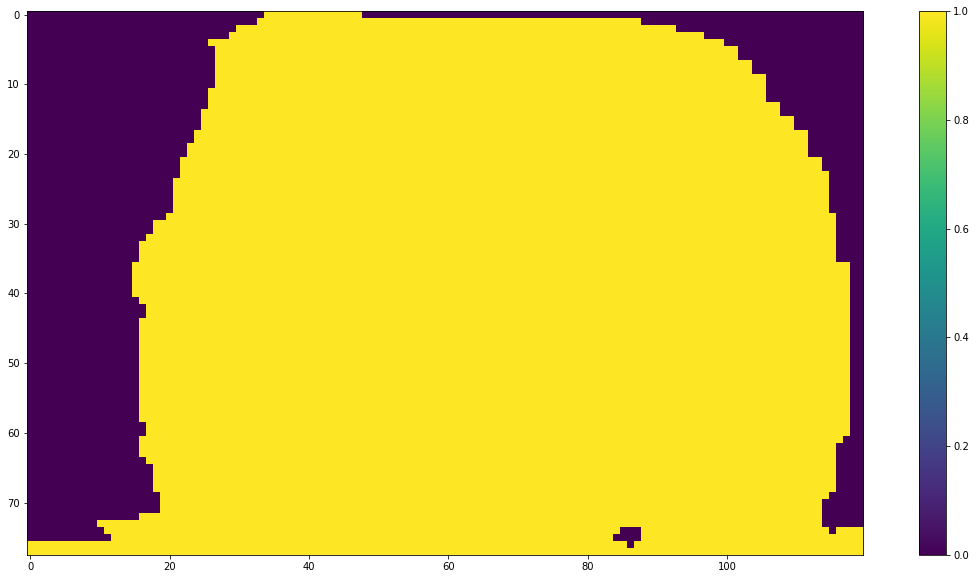

In [141]:
filtered = (l2dist < 2)
fig, graph =plt.subplots(figsize=(20,10))
im = graph.imshow(filtered.astype(int))
fig.colorbar(im, ax=graph)

#### min and max along X,Y,Z of Car

In [135]:
X,Y,Z = worldcoor[:,:,0], worldcoor[:,:,1], worldcoor[:,:,2]
car_X, car_Y, car_Z = X* filtered.astype(int),Y* filtered.astype(int),Z* filtered.astype(int)

In [136]:
Xmin, Xmax = np.min(car_X[np.nonzero(car_X)]), np.max(car_X[np.nonzero(car_X)])
Ymin, Ymax = np.min(car_Y[np.nonzero(car_Y)]), np.max(car_Y[np.nonzero(car_Y)])
Zmin, Zmax = np.min(car_Z[np.nonzero(car_Z)]), np.max(car_Z[np.nonzero(car_Z)])
eightCorners = np.array([[Xmin, Ymin, Zmin], [Xmin, Ymax, Zmin], [Xmax, Ymax, Zmin], [Xmax, Ymin, Zmin],
                         [Xmin, Ymin, Zmax], [Xmin, Ymax, Zmax], [Xmax, Ymax, Zmax], [Xmax, Ymin, Zmax]])

#### Convert to 2D points

In [130]:
def convert2Img(point):
    x,y,z = point
    x_img = ((f*x)/z) + px
    y_img = ((f*y)/z) + py
    return x_img, y_img

In [138]:
eightCornersOnImg = []
for i in eightCorners:
    eightCornersOnImg.append(convert2Img(i))
eightCornersOnImg = np.array(eightCornersOnImg).astype(int)

(-0.5, 1241.5, 374.5, -0.5)

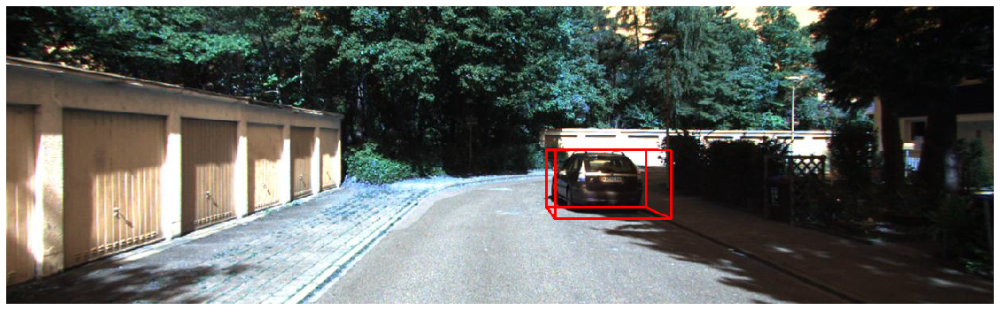

In [152]:
left_copy = left_img.copy()
color = (255,0,0)
thickness = 2
img1 = cv2.line(left_copy, tuple(eightCornersOnImg[0]), tuple(eightCornersOnImg[1]), color, thickness)
img1 = cv2.line(left_copy, tuple(eightCornersOnImg[0]), tuple(eightCornersOnImg[3]), color, thickness)
img1 = cv2.line(left_copy, tuple(eightCornersOnImg[1]), tuple(eightCornersOnImg[2]), color, thickness)
img1 = cv2.line(left_copy, tuple(eightCornersOnImg[2]), tuple(eightCornersOnImg[3]), color, thickness)

img1 = cv2.line(left_copy, tuple(eightCornersOnImg[0]), tuple(eightCornersOnImg[4]), color, thickness)
img1 = cv2.line(left_copy, tuple(eightCornersOnImg[1]), tuple(eightCornersOnImg[5]), color, thickness)
img1 = cv2.line(left_copy, tuple(eightCornersOnImg[2]), tuple(eightCornersOnImg[6]), color, thickness)
img1 = cv2.line(left_copy, tuple(eightCornersOnImg[3]), tuple(eightCornersOnImg[7]), color, thickness)

img1 = cv2.line(left_copy, tuple(eightCornersOnImg[4]), tuple(eightCornersOnImg[7]), color, thickness)
img1 = cv2.line(left_copy, tuple(eightCornersOnImg[4]), tuple(eightCornersOnImg[5]), color, thickness)
img1 = cv2.line(left_copy, tuple(eightCornersOnImg[5]), tuple(eightCornersOnImg[6]), color, thickness)
img1 = cv2.line(left_copy, tuple(eightCornersOnImg[6]), tuple(eightCornersOnImg[7]), color, thickness)
fig3, graph =plt.subplots(figsize=(20,10))
graph.imshow(img1,cmap="gray")
graph.axis('off')

## Question 3

In [157]:
I1_color = cv2.imread("I1.jpg")
I2_color = cv2.imread("I2.jpg")
I3_color = cv2.imread("I3.jpg")
I1 = cv2.cvtColor(I1_color, cv2.COLOR_BGR2GRAY)
I2 = cv2.cvtColor(I2_color, cv2.COLOR_BGR2GRAY)
I3 = cv2.cvtColor(I3_color, cv2.COLOR_BGR2GRAY)

### Using SIFT for matching

In [158]:
sift = cv2.xfeatures2d.SIFT_create()
kp1, des1 = sift.detectAndCompute(I1,None)
kp2, des2 = sift.detectAndCompute(I2,None)
kp3, des3 = sift.detectAndCompute(I3,None)

In [159]:
bf = cv2.BFMatcher()
matches1 = bf.knnMatch(des1,des2,k=2)
matches2 = bf.knnMatch(des1,des3,k=2)

#### Plotting matches between images

In [162]:
def getPointsFromMatch(match, kpone, kptwo):
    rpoints = []
    lpoints = []
    for i in range(len(match)):
        xr, yr = kpone[match[i][0].queryIdx].pt
        xl, yl = kptwo[match[i][0].trainIdx].pt
        rpoints.append((int(xr), int(yr)))
        lpoints.append((int(xl), int(yl)))
    return np.array(rpoints), np.array(lpoints)

In [354]:
colors = [(0,255,0),(0,0,255),(255,0,0),(255,255,0),(0,255,255),(255,0,255),(255,125,255),(255,125,125)]

In [338]:
newI1_1 = I1_color.copy()
newI1_2 = I1_color.copy()
newI2 = I2_color.copy()
newI3 = I3_color.copy()

#### I1 and I2

In [355]:
good1 = []
for m,n in matches1:
    if m.distance < 0.6*n.distance:
        good1.append([m])
# good1 = random.sample(good1, 8)
good1 = [good1[20], good1[85], good1[690], good1[1500], good1[2300], good1[4950], good1[6210], good1[7200]]

(-0.5, 4031.5, 3023.5, -0.5)

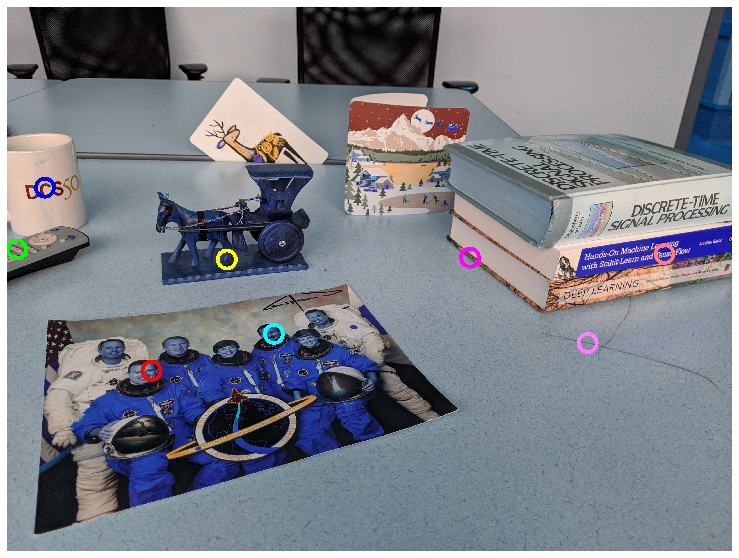

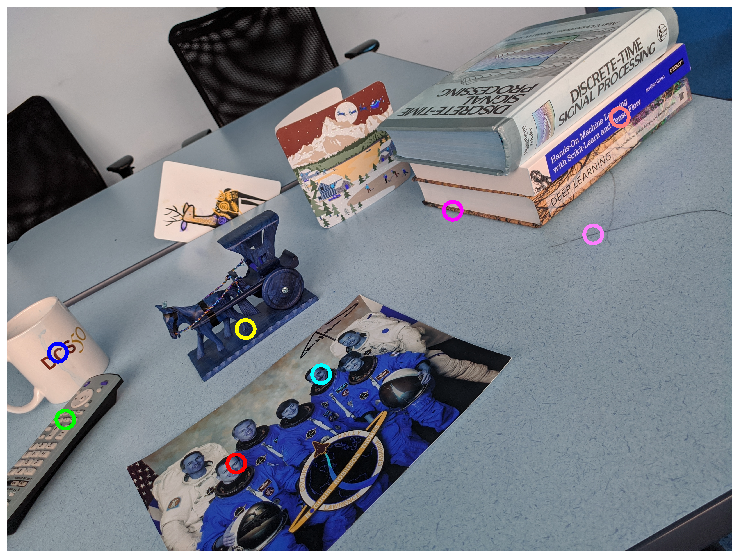

In [356]:
rpoints1, lpoints1 = getPointsFromMatch(good1, kp1, kp2)
for i in range(len(rpoints1)):
    img1 = cv2.circle(newI1_1, tuple(rpoints1[i]), radius=50, color=colors[i],thickness=20)
    img2 = cv2.circle(newI2, tuple(lpoints1[i]), radius=50, color=colors[i],thickness=20)
fig3, graph =plt.subplots(figsize=(20,10))
graph.imshow(img1,cmap="gray")
graph.axis('off')
fig4, graph =plt.subplots(figsize=(20,10))
graph.imshow(img2,cmap="gray")
graph.axis('off')

#### I1 and I3

In [337]:
good2 = []
for m,n in matches2:
    if m.distance < 0.8*n.distance:
        good2.append([m])
# good2 = random.sample(good2, 8)
good2 = [good2[20], good2[85], good2[200], good2[420], good2[589], good2[800], good2[1296], good2[1800]]

(-0.5, 4031.5, 3023.5, -0.5)

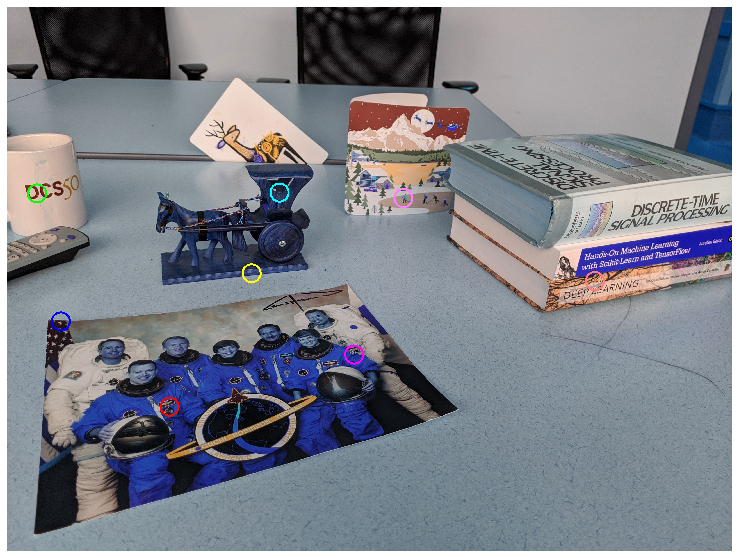

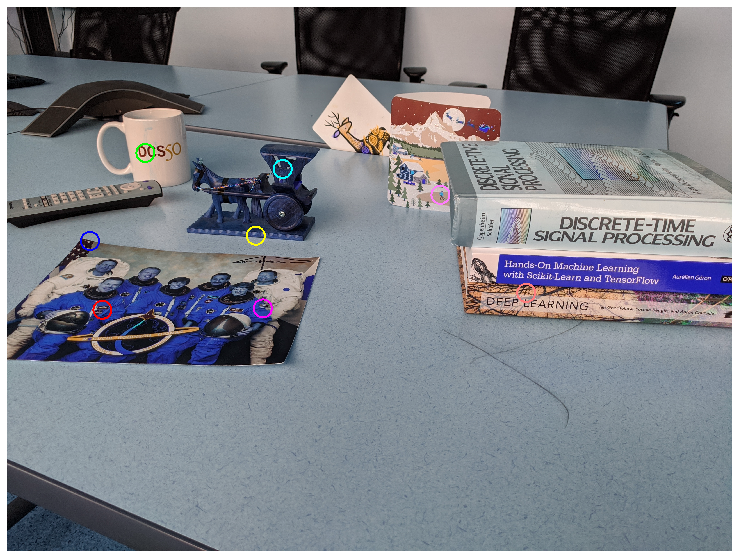

In [357]:
rpoints2, lpoints2 = getPointsFromMatch(good2, kp1, kp3)
for i in range(len(rpoints2)):
    img3 = cv2.circle(newI1_2, tuple(rpoints2[i]), radius=50, color=colors[i],thickness=10)
    img4 = cv2.circle(newI3, tuple(lpoints2[i]), radius=50, color=colors[i],thickness=10)
fig5, graph =plt.subplots(figsize=(20,10))
graph.imshow(img3)
graph.axis('off')
fig6, graph =plt.subplots(figsize=(20,10))
graph.imshow(img4)
graph.axis('off')

### Eight Point Algorithm

In [317]:
def eightpoints(lpoints, rpoints):
    results = []
    for i in range(len(rpoints)):
        row = [lpoints[i][0]*rpoints[i][0], lpoints[i][0]*rpoints[i][1], lpoints[i][0], 
               lpoints[i][1]*rpoints[i][0], lpoints[i][1]*rpoints[i][1], lpoints[i][1], 
               rpoints[i][0], rpoints[i][1], 1.]
        results.append(row)
    results = np.array(results)
    U,S,V = np.linalg.svd(results)
    F = V[-1].reshape(3,3)
    U,S,V = np.linalg.svd(F)
    S[2] = 0
    F = np.dot(U, np.dot(np.diag(S), V))
    return F/F[2,2]

#### Fundamental Matrix from the eight point algorithm

In [326]:
fmatrix1 = eightpoints(lpoints1,rpoints1)
print(fmatrix1)

[[ 6.77596582e-08 -1.25020460e-07  1.28190369e-03]
 [ 1.39207047e-07  7.48632893e-08 -4.34643056e-04]
 [-1.42089146e-03 -3.92617413e-04  1.00000000e+00]]


In [340]:
fmatrix2 = eightpoints(lpoints2,rpoints2)
print(fmatrix2)

[[ 8.75995489e-08  6.71637208e-07 -6.76076670e-04]
 [-5.06405322e-07  5.51072707e-07 -1.20422994e-03]
 [ 3.72559204e-04 -5.04332606e-04  1.00000000e+00]]


### Drawing Epipolar lines from our Fundamental Matrix

In [175]:
def drawlines(img1,img2,lines,pts1,pts2):
    r,c = img1.shape
    img1 = cv2.cvtColor(img1,cv2.COLOR_GRAY2BGR)
    img2 = cv2.cvtColor(img2,cv2.COLOR_GRAY2BGR)
    for r,pt1,pt2 in zip(lines,pts1,pts2):
        color = tuple(np.random.randint(0,255,3).tolist())
        x0,y0 = map(int, [0, -r[2]/r[1] ])
        x1,y1 = map(int, [c, -(r[2]+r[0]*c)/r[1] ])
        img = cv2.line(img1, (x0,y0), (x1,y1), color,10)
    return img1

(-0.5, 4031.5, 3023.5, -0.5)

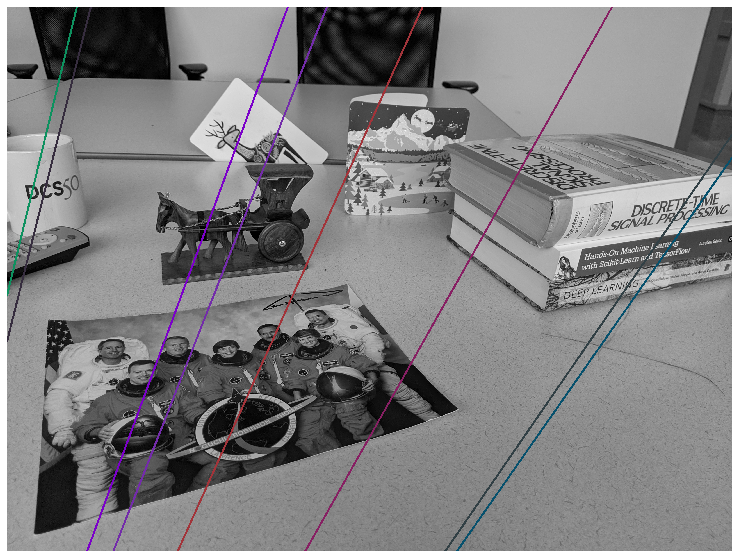

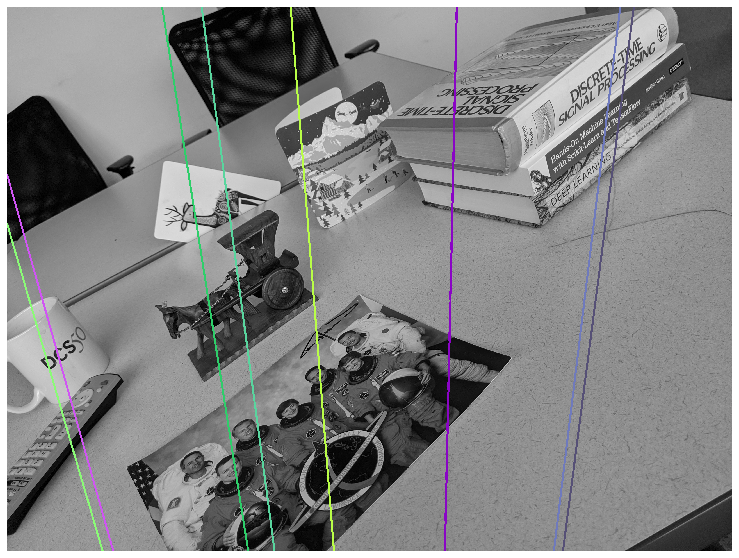

In [327]:
lines1 = cv2.computeCorrespondEpilines(lpoints1.reshape(-1,1,2), 2,fmatrix1)
lines1 = lines1.reshape(-1,3)
img1 = drawlines(I1,I2,lines1,rpoints1,lpoints1)

lines2 = cv2.computeCorrespondEpilines(rpoints1.reshape(-1,1,2), 1,fmatrix1)
lines2 = lines2.reshape(-1,3)
img2 = drawlines(I2,I1,lines2,lpoints1,rpoints1)

fig3, graph =plt.subplots(figsize=(20,10))
graph.imshow(img1)
graph.axis('off')
fig4, graph =plt.subplots(figsize=(20,10))
graph.imshow(img2)
graph.axis('off')

(-0.5, 4031.5, 3023.5, -0.5)

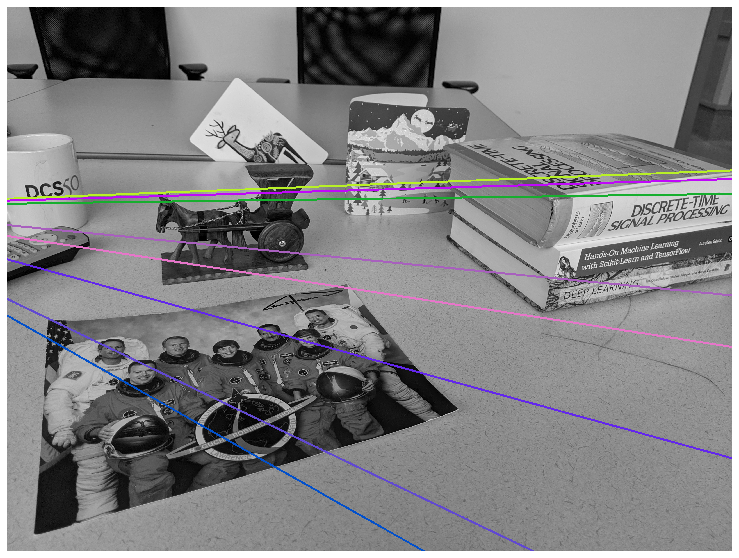

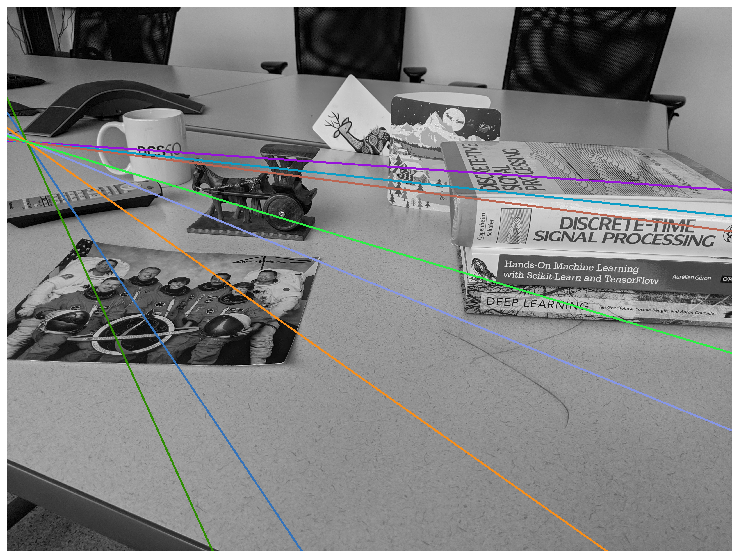

In [342]:
lines1 = cv2.computeCorrespondEpilines(lpoints2.reshape(-1,1,2), 2,fmatrix2)
lines1 = lines1.reshape(-1,3)
img1 = drawlines(I1,I3,lines1,rpoints2,lpoints2)

lines2 = cv2.computeCorrespondEpilines(rpoints2.reshape(-1,1,2), 1,fmatrix2)
lines2 = lines2.reshape(-1,3)
img2 = drawlines(I3,I1,lines2,lpoints2,rpoints2)

fig3, graph =plt.subplots(figsize=(20,10))
graph.imshow(img1)
graph.axis('off')
fig4, graph =plt.subplots(figsize=(20,10))
graph.imshow(img2)
graph.axis('off')

### Rectify images with Fundamental Matrx

#### I1 and I2

In [313]:
success, H1, H2 = cv2.stereoRectifyUncalibrated(rpoints1, lpoints1, fmatrix1, (I1.shape[1],I1.shape[0]))

(-0.5, 4031.5, 3023.5, -0.5)

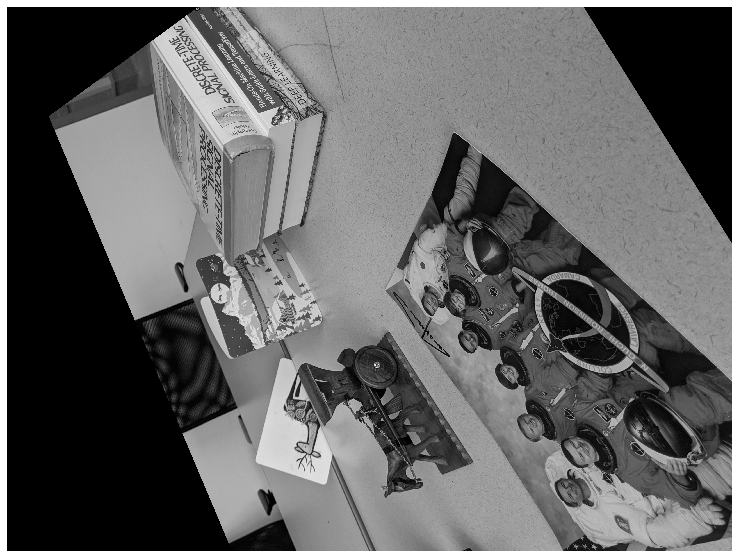

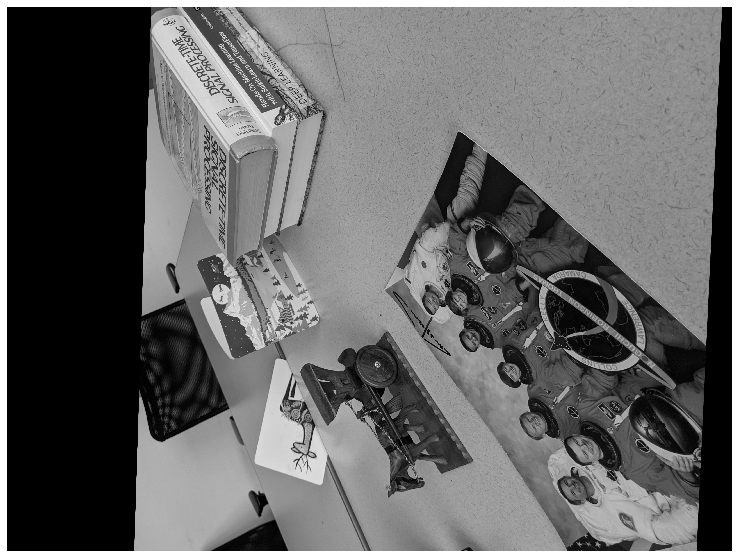

In [314]:
rect_I1 = cv2.warpPerspective(I1, H1, (I1.shape[1],I1.shape[0]))
rect_I2 = cv2.warpPerspective(I2, H2, (I2.shape[1],I2.shape[0]))
fig3, graph =plt.subplots(figsize=(20,10))
graph.imshow(rect_I1,cmap="gray")
graph.axis('off')
fig4, graph =plt.subplots(figsize=(20,10))
graph.imshow(rect_I2,cmap="gray")
graph.axis('off')

#### I1 and I3

In [343]:
success, H1, H2 = cv2.stereoRectifyUncalibrated(rpoints2, lpoints2, fmatrix2, (I1.shape[1],I1.shape[0]))

(-0.5, 4031.5, 3023.5, -0.5)

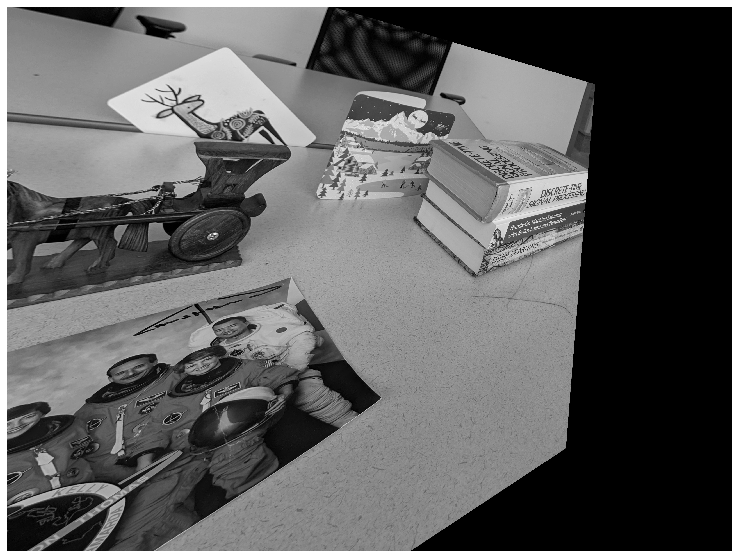

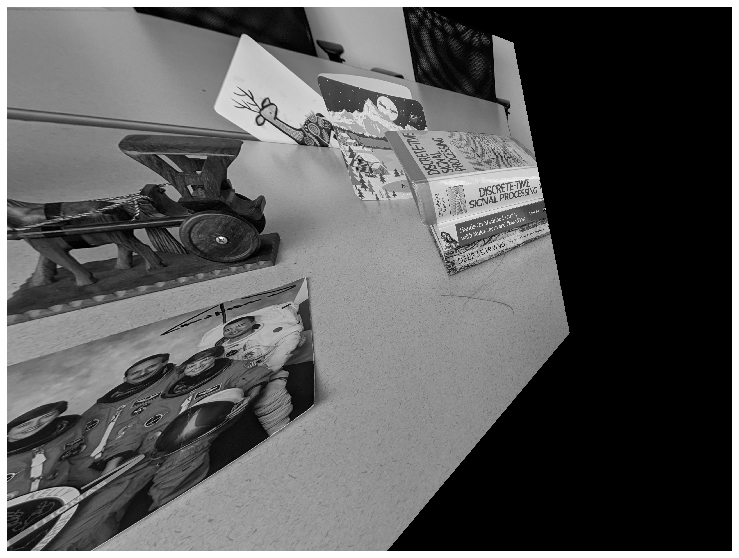

In [344]:
rect_I1 = cv2.warpPerspective(I1, H1, (I1.shape[1],I1.shape[0]))
rect_I2 = cv2.warpPerspective(I3, H2, (I2.shape[1],I2.shape[0]))
fig3, graph =plt.subplots(figsize=(20,10))
graph.imshow(rect_I1,cmap="gray")
graph.axis('off')
fig4, graph =plt.subplots(figsize=(20,10))
graph.imshow(rect_I2,cmap="gray")
graph.axis('off')

### Epipolar lines from cv2 Fundamental Matrix

In [361]:
allgood = []
for m,n in matches1:
    if m.distance < 0.6*n.distance:
        allgood.append([m])
r1, l1 = getPointsFromMatch(allgood, kp1, kp2)

In [362]:
F1, mask1 = cv2.findFundamentalMat(r1,l1,cv2.FM_8POINT)
print(F1)

[[ 8.69264528e-08 -1.81916661e-07 -1.37090954e-03]
 [ 1.52967202e-07  6.68051266e-08 -1.44330349e-03]
 [ 3.56800295e-04  1.89919008e-03  1.00000000e+00]]


In [371]:
allgood2 = []
for m,n in matches2:
    if m.distance < 0.5*n.distance:
        allgood2.append([m])
r2, l2 = getPointsFromMatch(allgood2, kp1, kp3)

In [372]:
F2, mask2 = cv2.findFundamentalMat(r2,l2,cv2.FM_8POINT)
print(F2)

[[ 8.16896744e-08  2.07818923e-07 -8.14570357e-04]
 [-7.08712271e-07  6.24792759e-07  4.84918762e-03]
 [ 4.42347147e-04 -4.79791874e-03  1.00000000e+00]]


(-0.5, 4031.5, 3023.5, -0.5)

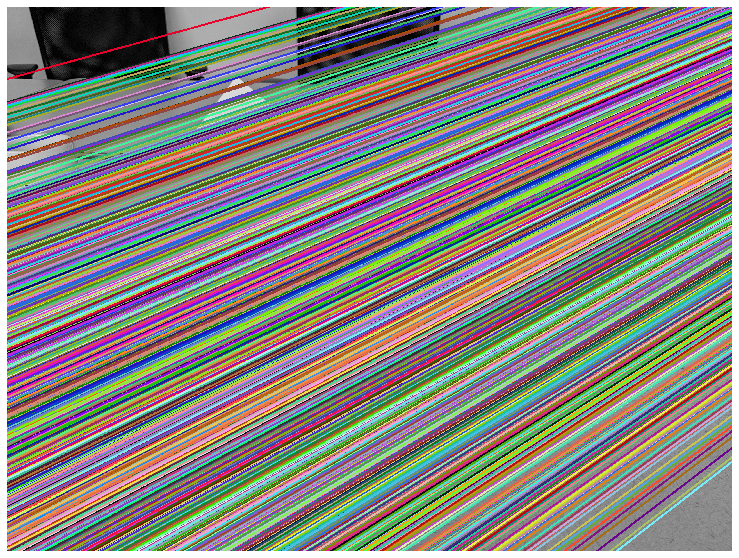

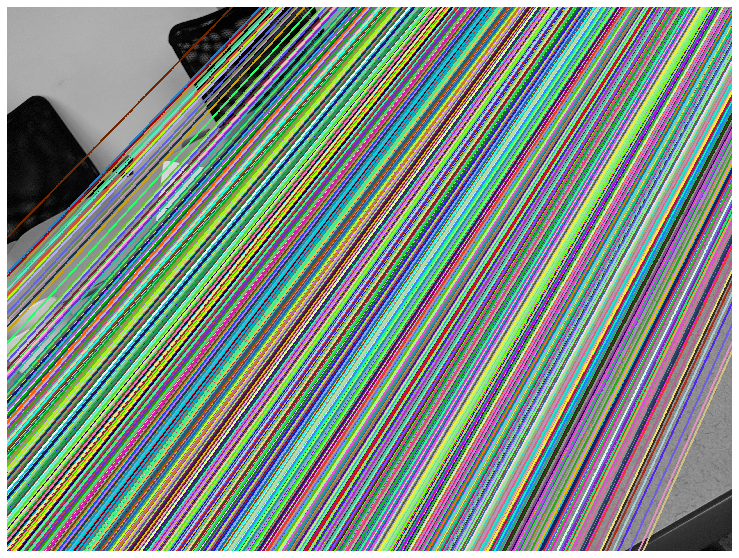

In [365]:
lines1 = cv2.computeCorrespondEpilines(l1.reshape(-1,1,2), 2,F1)
lines1 = lines1.reshape(-1,3)
img1 = drawlines(I1,I2,lines1,r1,l1)

lines2 = cv2.computeCorrespondEpilines(r1.reshape(-1,1,2), 1,F1)
lines2 = lines2.reshape(-1,3)
img2 = drawlines(I2,I1,lines2,l1,r1)

fig3, graph =plt.subplots(figsize=(20,10))
graph.imshow(img1)
graph.axis('off')
fig4, graph =plt.subplots(figsize=(20,10))
graph.imshow(img2)
graph.axis('off')

(-0.5, 4031.5, 3023.5, -0.5)

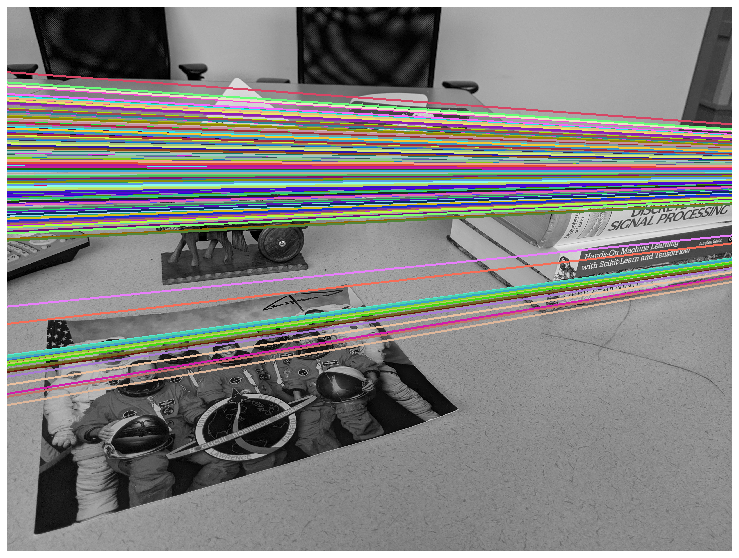

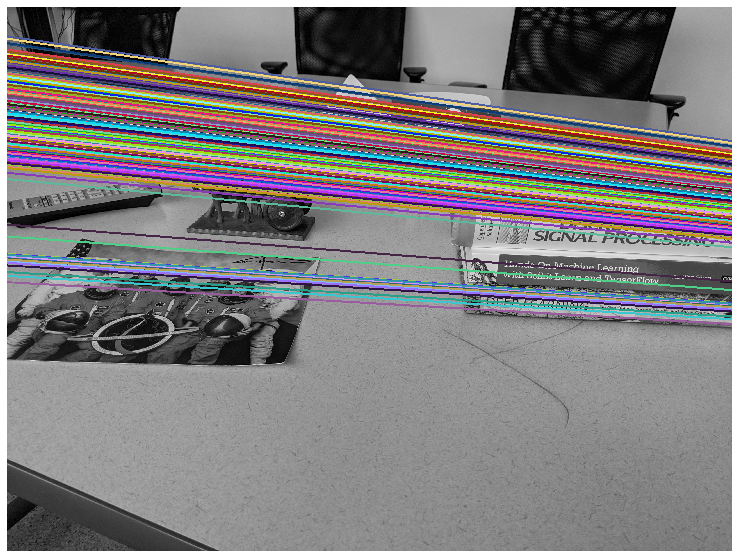

In [373]:
lines1 = cv2.computeCorrespondEpilines(l2.reshape(-1,1,2), 2,F2)
lines1 = lines1.reshape(-1,3)
img1 = drawlines(I1,I3,lines1,r2,l2)

lines2 = cv2.computeCorrespondEpilines(r2.reshape(-1,1,2), 1,F2)
lines2 = lines2.reshape(-1,3)
img2 = drawlines(I3,I1,lines2,l2,r2)

fig3, graph =plt.subplots(figsize=(20,10))
graph.imshow(img1)
graph.axis('off')
fig4, graph =plt.subplots(figsize=(20,10))
graph.imshow(img2)
graph.axis('off')

### Rectify images using CV2 Fundamental Matrices

#### I1 and I2

In [367]:
success, H1, H2 = cv2.stereoRectifyUncalibrated(r1, l1, F1, (I1.shape[1],I1.shape[0]))

(-0.5, 4031.5, 3023.5, -0.5)

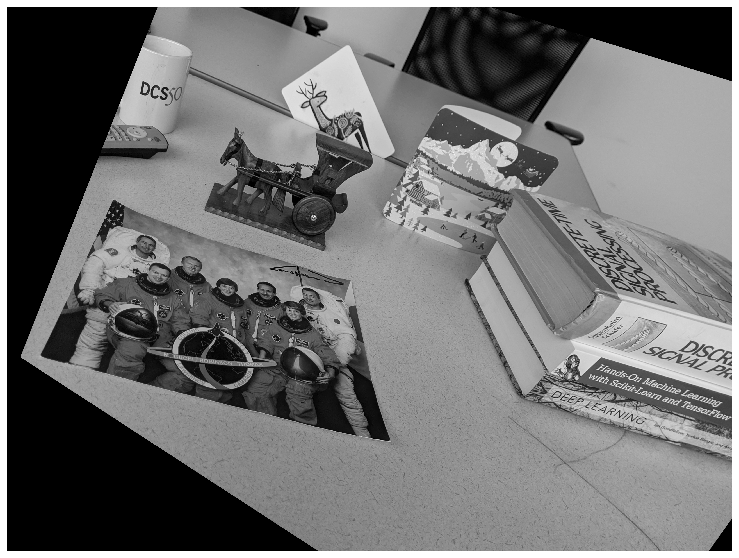

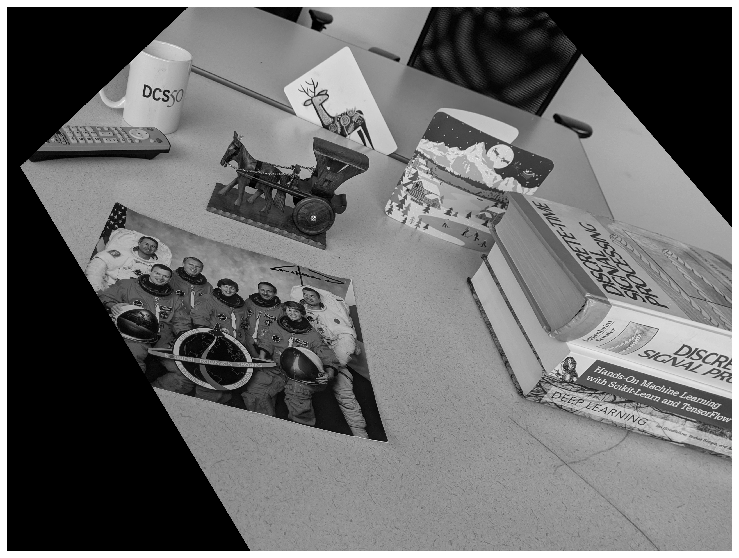

In [368]:
rect_I1 = cv2.warpPerspective(I1, H1, (I1.shape[1],I1.shape[0]))
rect_I2 = cv2.warpPerspective(I2, H2, (I2.shape[1],I2.shape[0]))
fig3, graph =plt.subplots(figsize=(20,10))
graph.imshow(rect_I1,cmap="gray")
graph.axis('off')
fig4, graph =plt.subplots(figsize=(20,10))
graph.imshow(rect_I2,cmap="gray")
graph.axis('off')

#### I1 and I3

In [374]:
success, H1, H2 = cv2.stereoRectifyUncalibrated(r2, l2, F2, (I1.shape[1],I1.shape[0]))

(-0.5, 4031.5, 3023.5, -0.5)

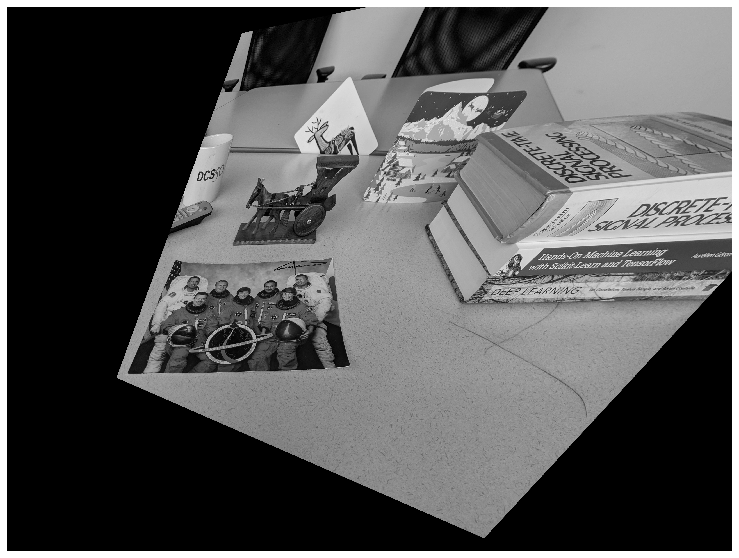

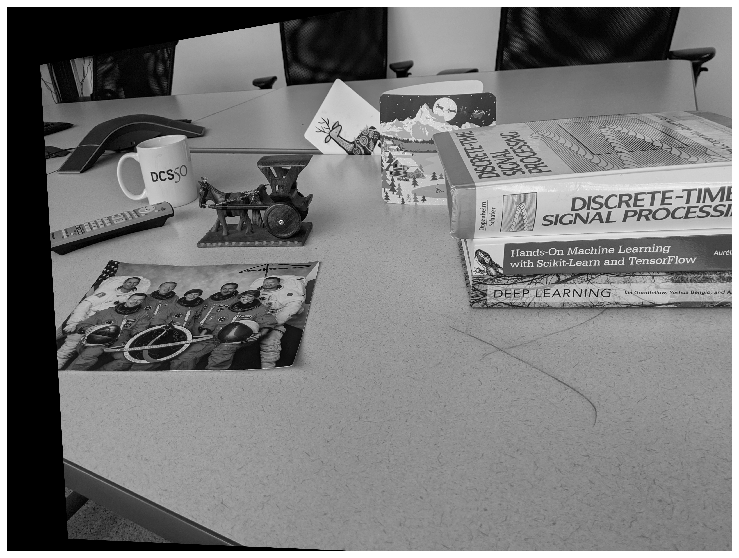

In [375]:
rect_I1 = cv2.warpPerspective(I1, H1, (I1.shape[1],I1.shape[0]))
rect_I2 = cv2.warpPerspective(I3, H2, (I3.shape[1],I3.shape[0]))
fig3, graph =plt.subplots(figsize=(20,10))
graph.imshow(rect_I1,cmap="gray")
graph.axis('off')
fig4, graph =plt.subplots(figsize=(20,10))
graph.imshow(rect_I2,cmap="gray")
graph.axis('off')